<a href="https://colab.research.google.com/github/binaria010/Mate2B-numerical-Analysis-/blob/main/Bird_soundsCompleto.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detección del canto de un  pájaro


## Objetivo:

 > <em>Diseñar un sistema de tal forma que, dado un archivo de audio corto (duración de 10 segs) clasifique según si hay un canto de de un pájaro (cualquier pájaro)</em>

<br>

Este tipo de problemas es importante en el estudio de la vida animal, pues es el primer paso al estudio del comportamiento social de los pájaros.



---



---



## Conjuntos de datos:

Para este trabajo vamos a contar con dos conjuntos de datos:

1. Un conjunto de 3 archivos de audio: ```debussy.wav```, ```duke.wav```, y ```redhot.wav``` que se encuentran en la carpeta **audioExamples***. Estos tres archivos van a servirnos para ejemplificar las distintas características que podemos determinar para una señal de audio dada.

2. Un conjunto de 100 archivos de audio: las 100 grabaciones de audio con las cuales vamos a trabajar el problema de interés. En el momento de hacer la clasificación, es decir, determinar si en una grabación dada hay un canto de un pájaro, vamos a partir este conjunto de 100 señales de audio (grabaciones) en dos, uno de 70 audios (este subconjuto lo vamos a llamar training set o conjunto de entrenamiento) y uno de 30 (este conjunto lo vamos a llamar test set o conjunto de prueba).

3. Hay un archivo mas: ```labels.csv``` que tiene la siguiente información: para cada señal de audio va atener una "etiqueta" o valor numérico de 1 o 0 según si en dicho audio hay un canto de un pájaro. Esta etiqueta será como la variable respuesta qye queremos predecir usando una regresión.


### Settings generales :
seteamos algunas cosas para poder acceder a los archivos sin necesidad de subirlos uno a uno.

Un primer paso es cargar nuestro drive de google, donde van a estar alojados todos los archivos que vamos a usar en este trabajo

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


La siguiente celda de código le indica a python que vamos a estar trabajando en cierta carpeta del drive que subimos en el paso anterior.

Es importante ser ordenados en la ubicación de los archivos.

In [ ]:
import os

#ruta_caarpeta_de_trabajo ='/content/gdrive/MyDrive/MateIIB/Trabajo Practico'
#os.chdir(ruta_carpeta_de_trabajo)  # en colab

ruta_carpeta_de_trabajo = "/Users/juliana/Library/CloudStorage/GoogleDrive-juliosoriomorales@gmail.com/My Drive/MateIIB/Trabajo Practico"

os.chdir(ruta_carpeta_de_trabajo)

_______________________________
________________________________

## Marco teórico:

En esta sección introducimos una serie de características que se pueden obtener de una señal de audio dada. Algunas de estas características las vamos a usar para resolver el problema de clasificación planteado arriba, esto es, el de detectar en un archivo de audio dado si hay un canto de un pájaro o no.

A lo largo de esta sección van a encontrar ejemplos y ejercicios/preguntas para responder.



Importamos las librerías a ser usadas durante todo el trabajo:

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import librosa, librosa.display, librosa.feature
import IPython.display as ipd
import pandas as pd

Escuchemos una señal de audio

In [ ]:
#bird_sound_file = "./data/audio_files/026eceb5-3e21-4fdc-b6d3.wav"   # en colab

bird_sound_file1 = "AudioFiles/026eceb5-3e21-4fdc-b6d3.wav"

bird_sound_file2 = "AudioFiles/1a01ceda-65d3-4c7a-bdf7.wav"





Si queremos reproducir el audio simplemente usamos la librería **IPython.display**

In [ ]:
ipd.Audio(bird_sound_file1)

In [ ]:
ipd.Audio(bird_sound_file2)

**Pregunta**

¿Si tuviermos que clasificar estas dos señales de audio, a partir de solamente escucharlos, que etiqueta le pondríamos a cada uno de ellos?


**Respuesta**:

file1 :

file2 :

Por supuesto que la idea de clasificar un archivo como 0 o 1 a partir de solamente escucharlo es algo impráctico, sobre todo porque en este problema tenemos 100 archivos y hay otros casos en los que la base de datos de las grabaciones es muchísimo mayor, y más aún, ser los audios de mayor longitud.

Para resolver este problema usando "inteligencia artificial" vamos a hacer un procesamiento de cada grabación que extraiga características de cada uno de ellos y que dichas características nos permitan identificar si hay presencia del canto de un pájaro.

##  Procesamiento de un archivo de audio

Importamos un archivo de audio en python.

Para hacer esto usamos la librería **librosa**

Importemos esta librería y otras que van a ser útiles:



## Guardemos el audio en forma de vector:

Para guardar un audio particular como un dato de python usamos la librería **librosa**. La documentación de librosa se encuentra en:
http://librosa.org/doc/0.8.1/index.html




funciona de forma similar a la librería **pandas** nos permite guardar un archivo csv o txt como un dato de python

La función **librosa.load** recibe como input la ubicación del archivo (string) en la computadora, en nuestro caso esta ubicación la guardamos en la variable *sound_file*, y devuelve dos tipos de variables:

* la primera es la señal de audio como un vector (la señal sampleada o muestreada) y

* la segunda variable es el sampling_rate: la tasa a la cual hizo el muestreo o sampling de la señal, es decir el número de muestras que toma por cada segundo del audio. Por defecto el sampling_rate va a ser 22050 Hz (es decir 22050 puntos de la señal por segundo). Este valor por defecto se puede sobre escribir, indicandole que sr = sampling_rate queremos. Siempre vamos a usar el valor por defecto.

 Como ejemplo usamos el archivo de audio ```redhot.wav``` de la carpeta **audioExamples**

<br>
<br>

In [ ]:
redhot_file = "audioExamples/redhot.wav"  # este es el string que indica la ubicacion del archivo
ipd.Audio(redhot_file)

redhot, redhot_sample_rate = librosa.load(redhot_file)

In [ ]:
print("El tipo de dato de audio1 es :",  type(redhot_file), "el tamaño es: ", redhot.shape)

print("\n audio1 = ", redhot)

print("\n El tipo de dato de audio1_sample_rate es : ", type(redhot_sample_rate))

print("\n audio1_sample_rate = ", redhot_sample_rate)

El tipo de dato de audio1 es : <class 'str'> el tamaño es:  (661500,)

 audio1 =  [0.08999634 0.14868164 0.17251587 ... 0.09646606 0.11129761 0.06411743]

 El tipo de dato de audio1_sample_rate es :  <class 'int'>

 audio1_sample_rate =  22050


#### Visualicemos las señales

Las señales de audio las podemos graficar para tener una idea de su forma. A continuación como ejemplo vamos a cargar  con librosa los archivos ```debussy.wav```, ```duke.wav```, y ```redhot.wav``` y vamos a graficar las señales de cada uno de ellos. Además como recomendación, escuchar los audios y contrastar lo que se escucha con el respectivo gráfico.

In [ ]:
debussy_file = "audioExamples/debussy.wav"
redhot_file = "audioExamples/redhot.wav"
duke_file = "audioExamples/duke.wav"

In [ ]:
ipd.Audio(debussy_file)


In [ ]:
ipd.Audio(redhot_file)


In [ ]:

ipd.Audio(duke_file)

Como todos los sample_rates por defecto son 22050, este valor va a ser el mismo tanto para debussy como redhot como duke:

In [ ]:
debussy, sample_rate = librosa.load(debussy_file)
redhot, _ = librosa.load(redhot_file)
duke, _ = librosa.load(duke_file)

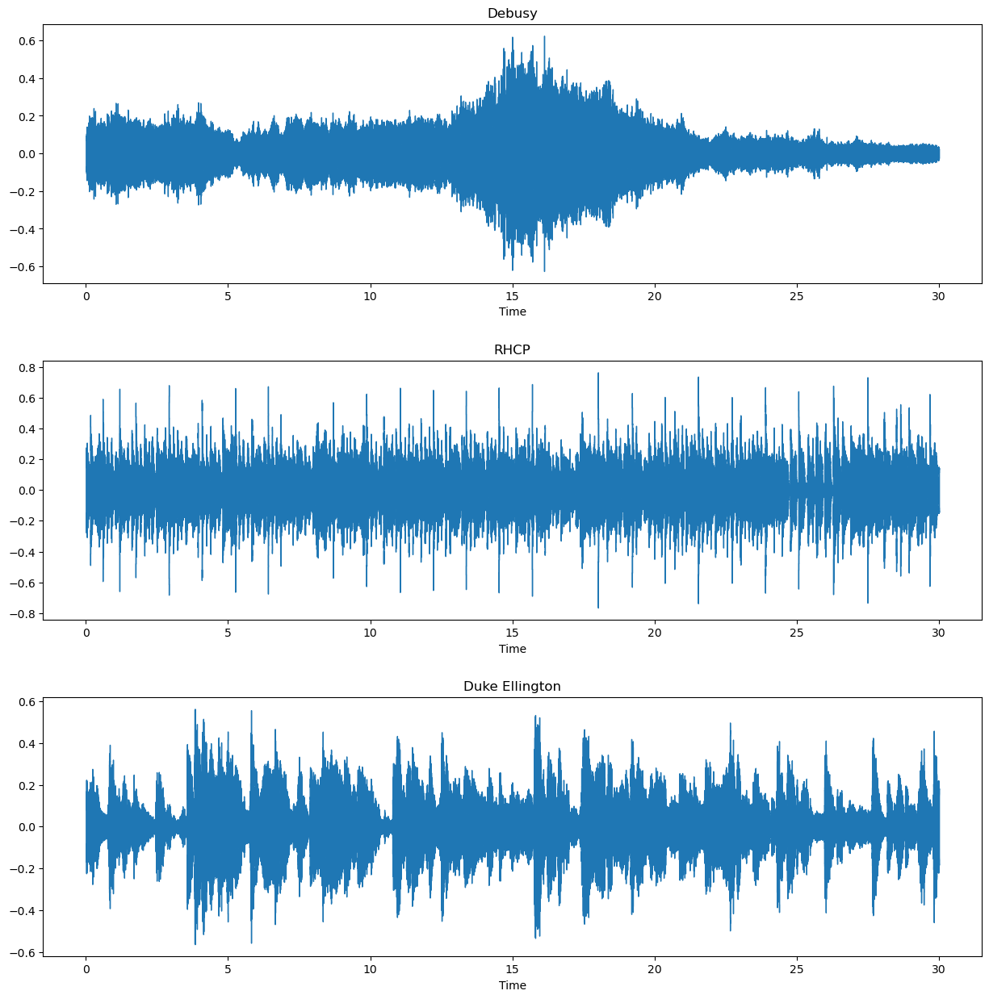

In [ ]:
plt.figure(figsize=(15, 15))
plt.subplots_adjust(hspace=0.3)   # esto para establecer un espacio entre los distintos plots

plt.subplot(3, 1, 1)
librosa.display.waveshow(debussy)
#plt.ylim((-1, 1))
plt.title("Debusy")

plt.subplot(3, 1, 2)
librosa.display.waveshow(redhot)
#plt.ylim((-1, 1))
plt.title("RHCP")        # red hot chilli peppers

plt.subplot(3, 1, 3)
librosa.display.waveshow(duke)
#plt.ylim((-1, 1))
plt.title("Duke Ellington")

plt.show()

Notar que por ejemplo la canción de Redhot tiene una melodía más constante o monótona y esto se puede observar en el gráfico. Mientras que la canción de Debussy tiene amplitudes altas entre los 15 y 20 segundos y esto se puede observar gráficamente.

#### ---------- Ejercicio 1: --------------

Para el archivo de audio ```bird_sound_file1``` que reprodujimos un par de celdas arriba, cargarlo en librosa para obtener el nnumpy array correspondiente y su respectivo sampling_rate

In [ ]:

bird, bird_sample_rate =  #librosa.load(bird_sound_file1)

Veamos que es ```bird``` y que es ```bird_sample_rate```

In [ ]:
print("El tipo de dato de bird es :",  type(bird), "el tamaño es: ", bird.shape)

print("\n bird = ", bird)

print("\n El tipo de dato de bird_sample_rate es : ", type(bird_sample_rate))

print("\n bird_sample_rate = ", bird_sample_rate)

El tipo de dato de bird es : <class 'numpy.ndarray'> el tamaño es:  (220672,)

 bird =  [-0.03848247 -0.05669383 -0.02958746 ... -0.06972987 -0.01826422
  0.13720384]

 El tipo de dato de bird_sample_rate es :  <class 'int'>

 bird_sample_rate =  22050


#### ---------- Ejercicio 2: --------------

Para los archivo de audio ```bird_sound_file1``` y ```bird_sound_file2``` que reprodujimos un par de celdas arriba, cargarlos en librosa  y graficarlos.

Escuchar ambas grabaciones y constrastar con los gráficos de las señales. Dar una pequeña explicación de lo observado

In [ ]:
bird1, bird1_sample_rate =  #librosa.load(bird_sound_file1)
bird2, _ =  #librosa.load(bird_sound_file2)


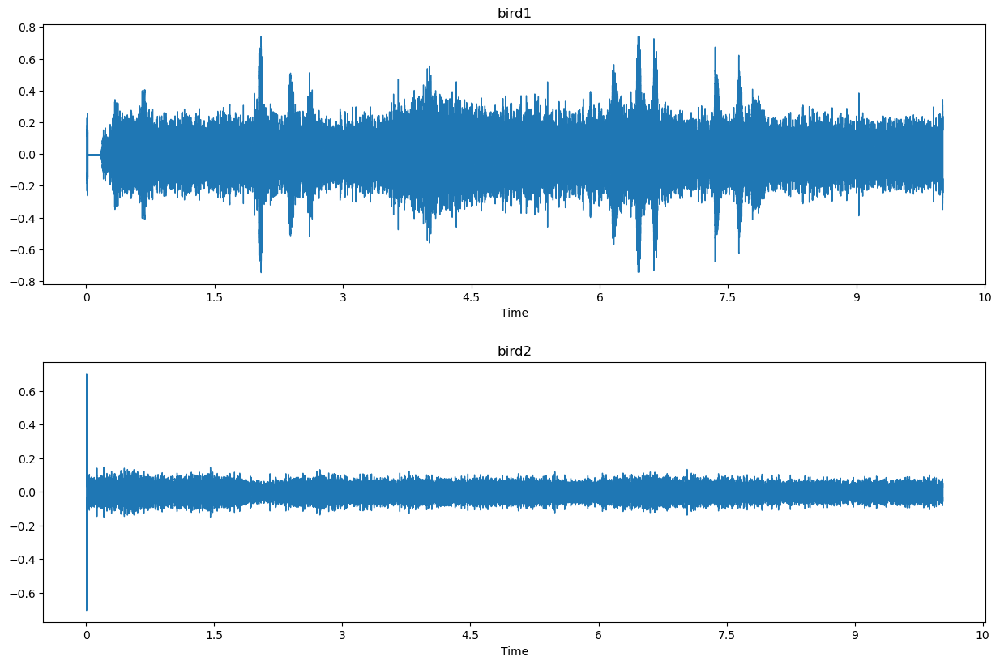

In [ ]:
# plt.figure(figsize=(15, 15))
# plt.subplots_adjust(hspace=0.3)   # esto para establecer un espacio entre los distintos plots

# plt.subplot(3, 1, 1)
# librosa.display.waveshow(bird1)
# #plt.ylim((-1, 1))
# plt.title("bird1")

# plt.subplot(3, 1, 2)
# librosa.display.waveshow(bird2)
# #plt.ylim((-1, 1))
# plt.title("bird2")

# plt.show()



______________________________________
______________________________________

## Características de una señal de audio:

Dada una señal de audio se pueden abstraer/obtener distintas características que se pueden utilizar para el problema de clasificación. Veamos algunas de estas en el dominio del tiempo y de la frecuencia.

Una característica en el dominio del tiempo es una obtenida sobre la señal de audio dada originalmente.
Una característica en el dominio de la frecuencia es una obtenida sobre la señal de audio transformada, es decir sobre la transformada de Fourier discreta de la señal.

Para resolver el problema de clasificaciøn planteado arriba, usaremos características en obtenidas en ambos dominios.

Vamos a ir ilustrando dichas caracterísiticas en los archivos de **audioExamples** y como ejercicio la tarea de uds es hacerlo sobre los dos archivos ```bird_sound_file1``` y ```bird_sound_file2```
<br>
<br>
<br>
*Comentario*:

*Si bien las caracterísiticas que vamos a ir presentando tienen una definición matemática formal, acá daremos nociones informales. La idea es tener una intuición sobre dichas características y no como sería su cálculo en forma analítica*





__________________

### Características en el dominio del tiempo:

Dada la señal de audio podemos determinar:

1.   Una onda o amplitud envolvente.
2.   RMS energy: la raiz cuadrada de la energía media de la señal.

Estas dos características se calculan en ventanas o frames (porciones de la señal) de un tamaño a elección. Además dichas ventanas se pueden y se deben pedir con un solapamiente también de un tamaño a elección.

#### Onda Envolvente:

La onda o amplitud envolvente se calcula de la siguiente forma: Se eligen ventanas  en la senal (porciones) y en cada ventana se halla el máximo valor de su amplitud.

Es una caracterísitica nos indica que tan "sonora es la señal"

Un tamaño común para el frame o ventana es un numero que sea una potencia de 2.

Consideremos el siguiente tamaño de ventana y el valor de cuanto pueden solaparse

In [ ]:
FRAME_SIZE = 1024    # tamanio de la ventana
HOP_LENGTH = 512    # longitud de solapamiento entre ventana y ventana

Esto lo hacemos con la siguiente función que implementamos acá (librosa no tiene una función implementada que lo haga)

In [ ]:
def amplitud_envolvente(signal, frame_size, hop_length):

  """
  Dada una senial de audio, esta funcion determina la amplitud maxima en cada ventana
   de la senial de tamanio frame_size con hop_length de solapamiento

  inputs :
  signal : numpy array (la senial de audio ya leida por librosa)
  frame_size: tamanio de las porciones de audio
  hop_length: tamanio de solapamiento entre ventana(frame) y ventana

  return
  emp_envolvente: numpy array e tamanio len(signal)/hop_length

  """

  amp_envolvente = [np.max(signal[i:i+frame_size])  for i in range(0, len(signal), hop_length)]

  return amp_envolvente


In [ ]:
print("en el caso de la senial debussy su longitud es: ", len(debussy))

print("la cantidad de componentes que tiene amp_envolvente es ", len(debussy)/HOP_LENGTH)

en el caso de la senial debussy su longitud es:  661500
la cantidad de componentes que tiene amp_envolvente es  1291.9921875


Comparemos para tres señales de audion muuy distintas como sería la onda envolvente de cada una de ellas.


Para esto usamos los audios ```debussy.wav```, ```redhot.wav```, ```duke.wav```. Las tres son de la misma duración en segundos. Son tres fragementos de piezas musicales de distintos generos. Recomiendo escuchar los audios y visualizar los plots para tener una intuición sobre esta caracterísitica y otras mas que vamos a considerar

In [ ]:
debussy_file = "audioExamples/debussy.wav"  #cambiar esto por la ruta local si es necesario
redhot_file = "audioExamples/redhot.wav"     #
duke_file = "audioExamples/duke.wav"



In [ ]:
amp_debussy = amplitud_envolvente(debussy, FRAME_SIZE, HOP_LENGTH)
amp_redhot = amplitud_envolvente(redhot, FRAME_SIZE, HOP_LENGTH)
amp_duke = amplitud_envolvente(duke, FRAME_SIZE, HOP_LENGTH)

print("la cantidad de componentes que tiene amp_envolvente es ", len(amp_debussy))

la cantidad de componentes que tiene amp_envolvente es  1292


Visualicemos las ondas envolventes de estas señales. Debemos primero definir una grilla o vector de tiempos, esto lo hacemos como antes con la funcion de librosa ```frams_to_time```

como los tres audios tienen la misma duracion sus frames y sus vectores de tiempos van a ser los mismos:

In [ ]:
frames = range(0, len(amp_debussy)) #definimos un iterable rango de valores de los frames
t = librosa.frames_to_time(frames = frames, hop_length = HOP_LENGTH)    #

print(t.shape)   # el tiempo va desde 0 hasta casi 10 segundos

print("el ultimo valor del tiempo en la grilla t es : " ,t[-1], " segundos")

print("los primeros 5 valores en t son :", t[:5])

(1292,)
el ultimo valor del tiempo en la grilla t es :  29.976961451247167  segundos
los primeros 5 valores en t son : [0.         0.02321995 0.04643991 0.06965986 0.09287982]


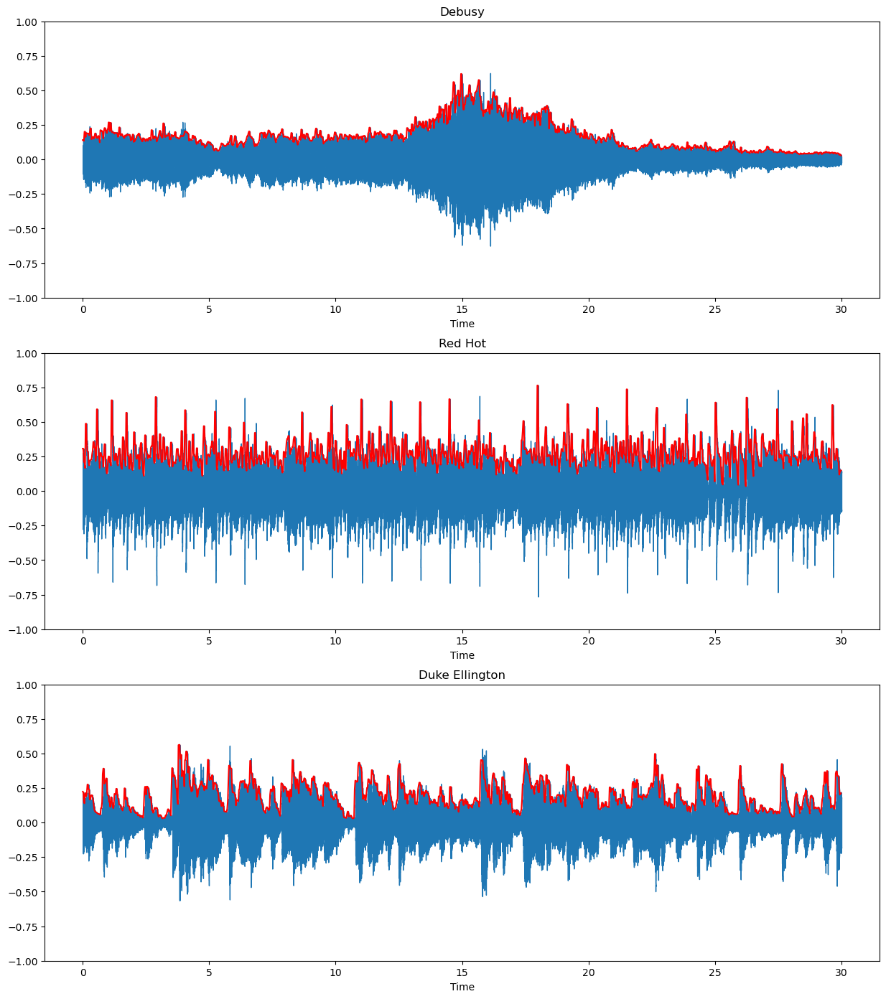

In [ ]:
plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(debussy)
plt.plot(t, amp_debussy, color="r", label = "amplitud envolvente")
plt.ylim((-1, 1))
plt.title("Debusy")

plt.subplot(3, 1, 2)
librosa.display.waveshow(redhot)
plt.plot(t, amp_redhot, color="r", label = "amplitud envolvente")
plt.ylim((-1, 1))
plt.title("Red Hot")

plt.subplot(3, 1, 3)
librosa.display.waveshow(duke)
plt.plot(t, amp_duke, color="r", label = "amplitud envolvente")
plt.ylim((-1, 1))
plt.title("Duke Ellington")

plt.show()

#### --------------- Ejercicio 3 --------------


Hallar la onda envolvente de la señal bird1 usando la función amplitud_envolvente que implementamos arriba.

In [ ]:
FRAME_SIZE = 1024    # tamanio de la ventana
HOP_LENGTH = 512    # longitud de solapamiento entre ventana y ventana


amp_envolvente_bird1 = #amplitud_envolvente(bird1, frame_size= FRAME_SIZE, hop_length=HOP_LENGTH)

len(amp_envolvente_bird1)

431

Visualizar la senial de audio ```bird1``` usando la funcion de librosa: librosa.display.waveshow como hicimos en el ejemplo, pero esta vez graficar por separado la señal de audio y la onda envolvente en dos subplots. PAra los gráficos recordar que hay ue definir la grilla de los tiempos con la funcion librosa.frames_to_time y para esto primero definimos el rango de los frames


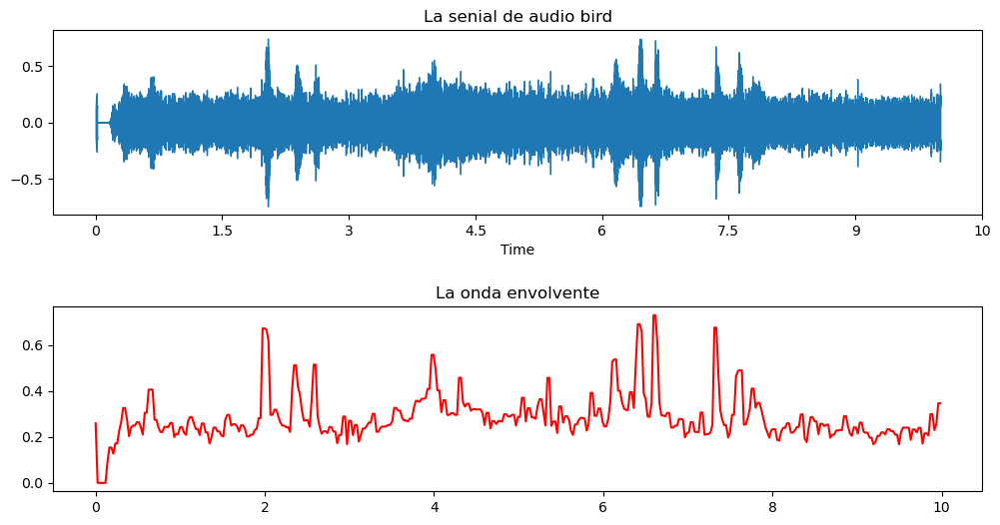

In [ ]:
frames = #range(0, len(amp_envolvente_bird1)) #definimos un iterable rango de valores de los frames
t = #librosa.frames_to_time(frames = frames, hop_length = HOP_LENGTH)    #


plt.figure(figsize=(12,6))
plt.subplots_adjust(hspace=0.5)
plt.subplot(2,1,1)
librosa.display.waveshow(bird1)
plt.title("La senial de audio bird")

plt.subplot(2,1,2)
plt.plot(t, amp_envolvente_bird1, color="r")
plt.title("La onda envolvente")
plt.show()


Ahora realizar un plot con la señal y la amplitud envolvente juntas como lo hicimos con los tres ejemplos antes.

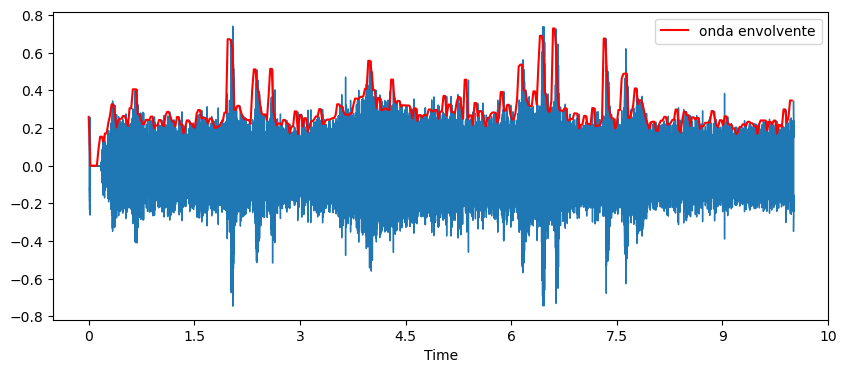

In [ ]:
# plt.figure(figsize = (10,4))
# librosa.display.waveshow(bird1)
# plt.plot(t, amp_envolvente_bird1, color="r", label = "onda envolvente")
# plt.legend()
# plt.show()





---



---



#### RMS

#### raiz cuadrada de la energía media

RMS: en cada ventana (porción de la señal de audio) se calcula la raiz cuadrada del promedio de las energias de la señal.  Es una caracterísitica que al igual que la onda envolvente nos indica que tan "sonora es la señal"

Librosa tiene implementada función que calcula el RMS en cada ventana o frame. Recibe como inputs la señal, el tamanio de la ventana y el tamaño del solapamiento.

Devuelve un 2D array, un vector fila de tamaño (1, N), La componete 0 es el RMS de la señal.

#### Ejemplo:

Comparemos los RMS de los audios ```debussy.wav```, ```redhot.wav```, ```duke.wav```. De nuevo, recomiendo escuchar los audios y visualizar los plots para tener una intuición sobre esta caracterísitica y otras mas que vamos a considerar

In [ ]:
rms_debussy = librosa.feature.rms(y=debussy, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_redhot = librosa.feature.rms(y = redhot, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_duke = librosa.feature.rms(y = duke, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

Visualicemos los RMS de cada audio: de nuevo calculamos el vector de los tiempos que es igual para las tres.

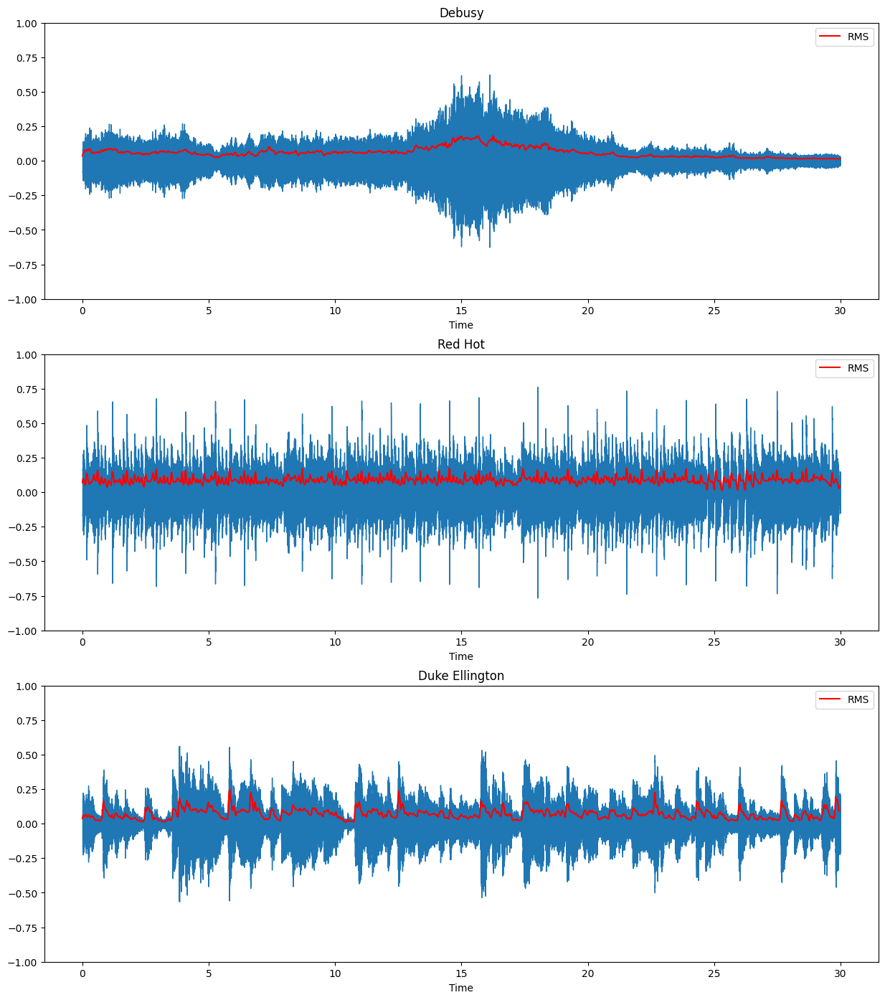

In [ ]:
frames = range(len(rms_debussy))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

plt.figure(figsize=(15, 17))

ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(debussy)
plt.plot(t, rms_debussy, color="r", label = "RMS")
plt.ylim((-1, 1))
plt.title("Debusy")
plt.legend()


plt.subplot(3, 1, 2)
librosa.display.waveshow(redhot)
plt.plot(t, rms_redhot, color="r", label = "RMS")
plt.ylim((-1, 1))
plt.title("Red Hot")
plt.legend()


plt.subplot(3, 1, 3)
librosa.display.waveshow(duke)
plt.plot(t, rms_duke, color="r", label = "RMS")
plt.ylim((-1, 1))
plt.title("Duke Ellington")
plt.legend()

plt.show()


#### ---------------------- Ejercicio 4 -------------

Hacer lo mismo para las señales bird1 y bird2

In [ ]:
bird1_rms = #librosa.feature.rms(y=bird1, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

bird1_rms.shape

(432,)

In [ ]:
bird2_rms = #librosa.feature.rms(y=bird2, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

bird2_rms.shape

(433,)

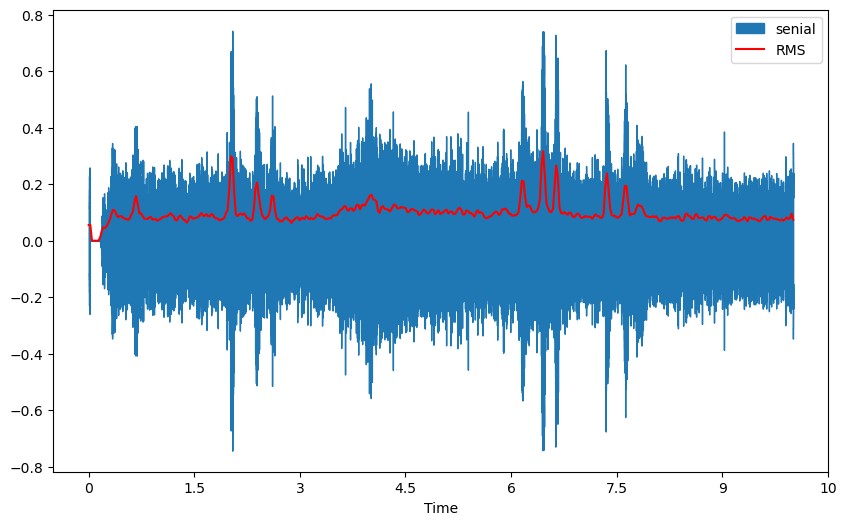

In [ ]:
frames1 = range(len(bird1_rms))
t1 = librosa.frames_to_time(frames1, hop_length=HOP_LENGTH)

# visualizamos la senial de audio y su RMS:
plt.figure(figsize=(10,6))
librosa.display.waveshow(bird1, label = "senial")
plt.plot(t1, bird1_rms, color="r", label = "RMS")
plt.legend()
plt.show()

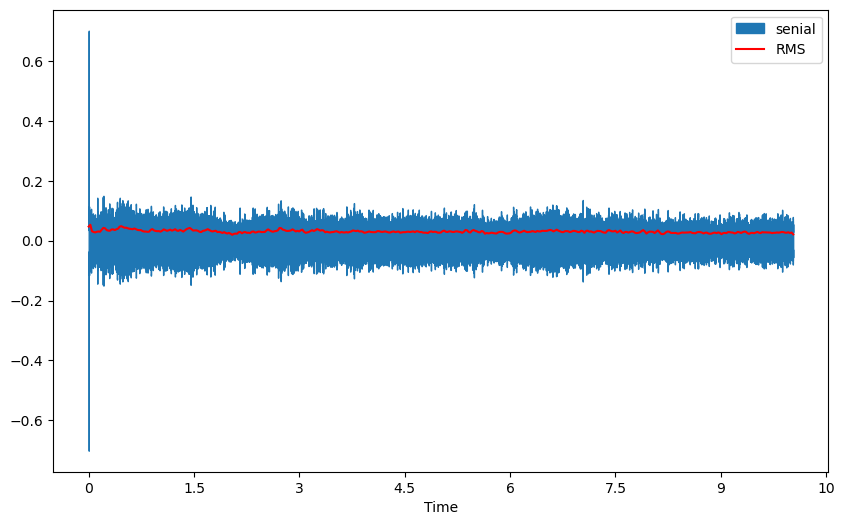

In [ ]:
frames2 = #range(len(bird2_rms))
t2 = #librosa.frames_to_time(frames2, hop_length=HOP_LENGTH)

# visualizamos la senial de audio y su RMS:
# plt.figure(figsize=(10,6))
# librosa.display.waveshow(bird2, label = "senial")
# plt.plot(t2, bird2_rms, color="r", label = "RMS")
# plt.legend()
# plt.show()



---



---



#### Zero Crossings rate (rate de cruces por el eje x)

Es la proporción de veces que la señal cruza el eje horizontal. Es una característica que se usa bastante para reconocer en señales de audio si hay presencia de voz o es ruido de fondo. En el caso de ruido o cuando la señal es muy constante, el plot debería ser muy parejo, mientras que si hay cambios en las tonalidades en la señal, el gráfico del zero crossing rate debería ser muy cambiante (esto se va a notar sobre todo en las señales de bird1 y bird2)

En el caso de la detección de pájaros va a ser una característica a considerar.

Con la función ```zero_crossing_rate``` de librosa podemos hallar estos zcr.


Como ejemplo ilustrativo usamos las mismas señales de audio de arriba:

In [ ]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

zcr_debussy = librosa.feature.zero_crossing_rate(debussy, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zcr_redhot = librosa.feature.zero_crossing_rate(redhot, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zcr_duke = librosa.feature.zero_crossing_rate(duke, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [ ]:
print("longitud de zero crossing rate para Debussy: ", len(zcr_debussy))
print("\nlongitud de zero crossing rate para Debussy: ", len(zcr_redhot))
print("\nlongitud de zero crossing rate para Debussy: ", len(zcr_duke))


longitud de zero crossing rate para Debussy:  1292

longitud de zero crossing rate para Debussy:  1292

longitud de zero crossing rate para Debussy:  1292


Visualizamos:  PAra esto como ya vemos que es usual definimos la grilla de tiempos. En este caso va a ser la misma para las tres señales de audio. Sin embargo, como ya vimos para el caso de las dos señales de birds, estas grillas son distintas asi que en ese caso las calculan por separado.


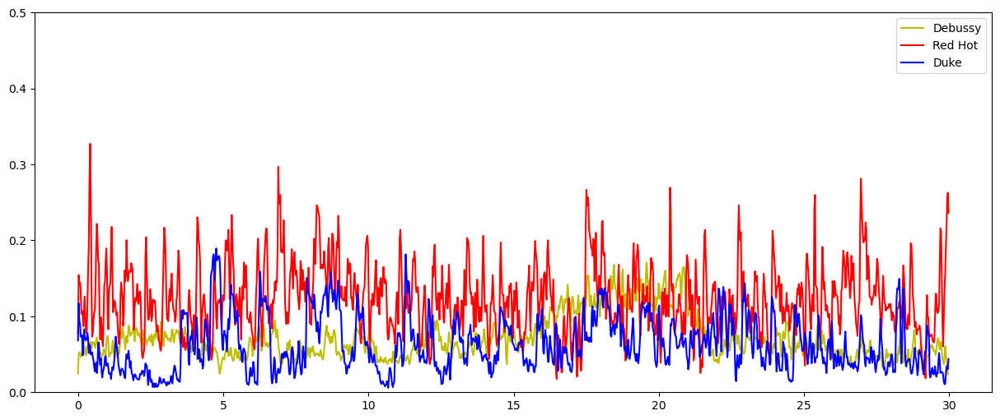

In [ ]:
frames = range(0, len(zcr_debussy))   # es el mismo para las 3
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

plt.figure(figsize=(15, 6))

plt.plot(t, zcr_debussy, color="y", label = "Debussy")
plt.plot(t, zcr_redhot, color="r", label = "Red Hot")
plt.plot(t, zcr_duke, color="b", label = "Duke")
plt.ylim(0, 0.5)
plt.legend()
plt.show()


#### ---------------- Ejercicio 5: ------------------

Para las señales bird1 y bird2 hallar los zcr y graficarlos en un mismo plot como hicimos recien. Recordar que para estas dos señales las grillas de tiempos son distintas.

Comparar ambos gráficos y dar una brevisima explicación de lo observado de acuerdo a la idea intuitiva que se tiene del zero crossing rate

In [ ]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

zcr_bird1 = #librosa.feature.zero_crossing_rate(bird1, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
zcr_bird2 = #librosa.feature.zero_crossing_rate(bird2, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [ ]:
print("longitud de zero crossing rate para bird1 ", len(zcr_bird1))
print("\nlongitud de zero crossing rate para bird2: ", len(zcr_bird2))

longitud de zero crossing rate para bird1  432

longitud de zero crossing rate para bird2:  433


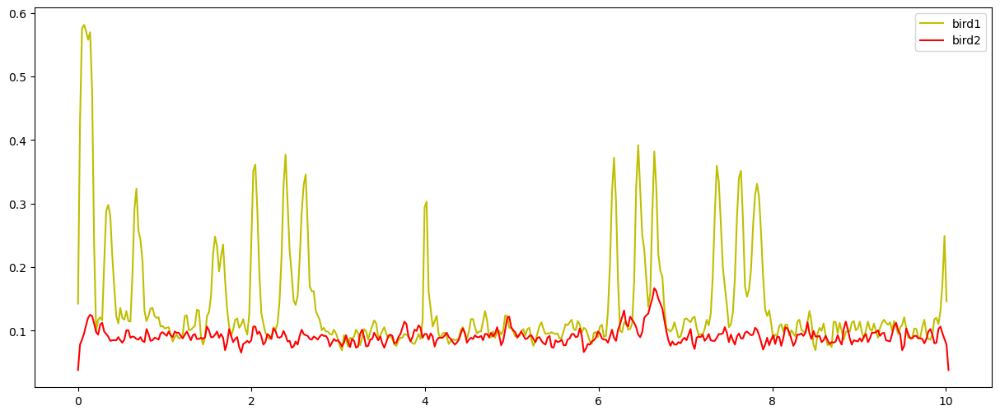

In [ ]:
frames1 = #range(0, len(zcr_bird1))
t1 = #librosa.frames_to_time(frames1, hop_length=HOP_LENGTH)

frames2 = #range(0, len(zcr_bird2))   # es el mismo para las 3
t2 = #librosa.frames_to_time(frames2, hop_length=HOP_LENGTH)


# plt.figure(figsize=(15, 6))

# plt.plot(t1, zcr_bird1, color="y", label = "bird1")
# plt.plot(t2, zcr_bird2, color="r", label = "bird2")
# plt.legend()
# plt.show()



---



---



---



#### Visualización de la señal en el dominio de la frecuencia:

Para esto, usamos la libreria scipy que nos calcula la DFT de una señal dada y graficamos su magnitud (dado que la DFT es una función a valores en los complejos)

In [ ]:
import scipy

Empecemos con la señal Debussy:

Para graficarla en el dominio de la frecuencia debemos definir una grilla de frecuencias que van a ser los valores del eje x. Esta grilla de frecuencias la creamos con un linspace

In [ ]:
# por las dudas volvamos a cargar los tres audios
debussy, sr = librosa.load(debussy_file)
redhot, _ = librosa.load(redhot_file)
duke, _  = librosa.load(duke_file)



In [ ]:
ft_debussy = scipy.fft.fft(debussy)
magnitud_debussy = np.absolute(ft_debussy)

len(magnitud_debussy)


661500

In [ ]:
ft_redhot = scipy.fft.fft(redhot)
magnitud_redhot = np.absolute(ft_redhot)

len(magnitud_redhot)

661500

In [ ]:
ft_duke = scipy.fft.fft(duke)
magnitud_duke = np.absolute(ft_duke)

len(magnitud_duke)

661500

Como las tres señales tienen la misma cantidad de componentes en el dominio de la frecuencia, usamos la misma grilla de frecuencias para graficar las tres

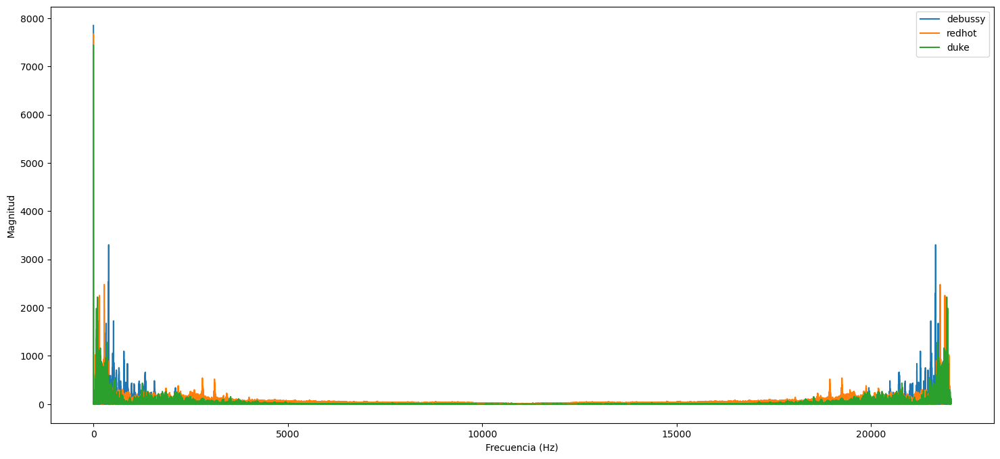

In [ ]:
# plot spectrum
frecuencia = np.linspace(0, sr, len(magnitud_debussy))   #grilla de frecuencias

plt.figure(figsize=(18, 8))
plt.plot(frecuencia, magnitud_debussy, label = "debussy") # magnitude spectrum
plt.plot(frecuencia, magnitud_redhot, label = "redhot")
plt.plot(frecuencia, magnitud_duke, label = "duke")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud")
plt.legend()
plt.show()

Realicemos un segundo plot donde solo visualicamos en el rango de 0 a 2500 Hz, esto porque se observa que 2500 HZ  hasta casi los 20000 no hay tantos picos


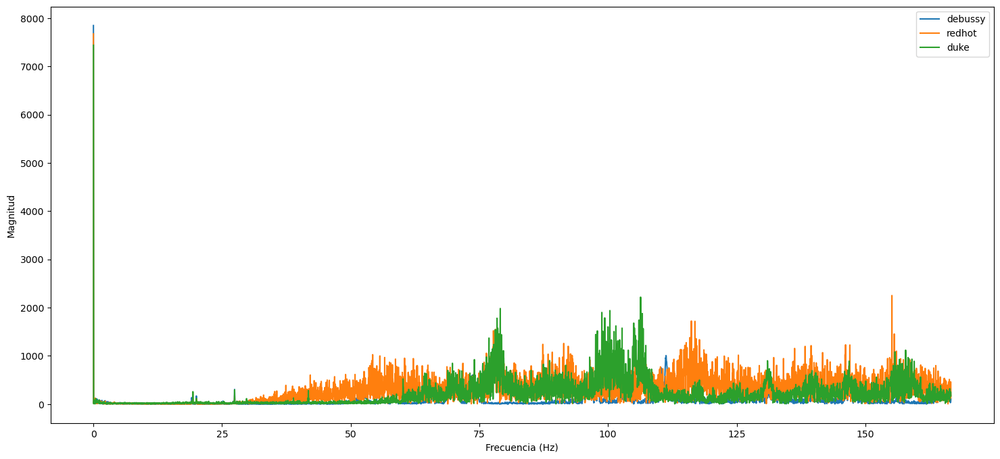

In [ ]:
# plot spectrum
frecuencia = np.linspace(0, sr, len(magnitud_debussy))   #grilla de frecuencias

plt.figure(figsize=(18, 8))
plt.plot(frecuencia[:5000], magnitud_debussy[:5000], label = "debussy") # magnitude spectrum
plt.plot(frecuencia[:5000], magnitud_redhot[:5000], label = "redhot")
plt.plot(frecuencia[:5000], magnitud_duke[:5000], label = "duke")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud")
plt.legend()
plt.show()

#### -------------- Ejercicio 6 -------------

Para las señales bird1 y bird2 calcular la DFT y realizar los gráficos de sus magnitudes. En este caso las señales tienen tamaños distintos por lo que al graficarlas definimos una grilla de frecuencia para cada una

In [ ]:
# por las dudas cargamos de nuevo a bird1 y bird2

bird1, sample_rate =  librosa.load(bird_sound_file1)
bird2, _ =  librosa.load(bird_sound_file2)

In [ ]:
ft_bird1 = scipy.fft.fft(bird1)
magnitud_bird1 = np.absolute(ft_bird1)

len(magnitud_bird1)

220672

In [ ]:
ft_bird2 = scipy.fft.fft(bird2)
magnitud_bird2 = np.absolute(ft_bird2)

len(magnitud_bird2)

221184

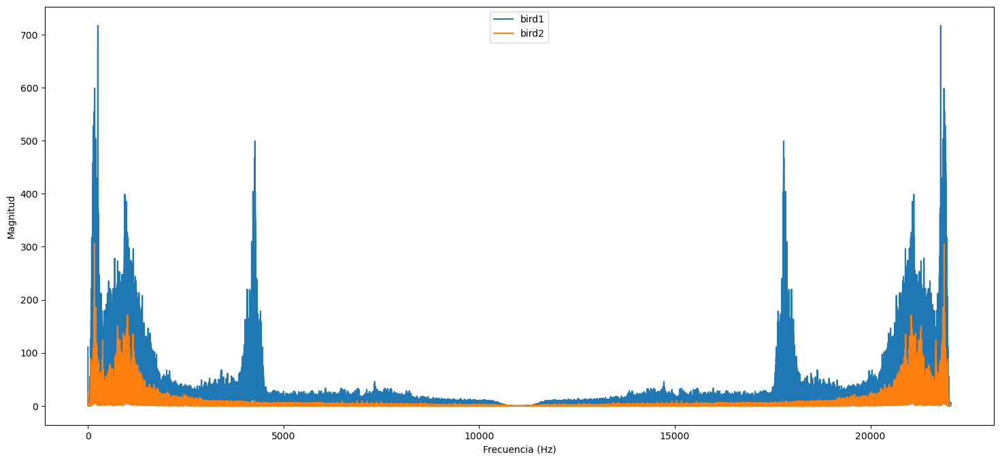

In [ ]:
frecuencia1 = np.linspace(0, sample_rate, len(magnitud_bird1))   #grilla de frecuencias para bird1
frecuencia2 = np.linspace(0, sample_rate, len(magnitud_bird2))   #grilla de frecuencias para bird2

plt.figure(figsize=(18, 8))
plt.plot(frecuencia1, magnitud_bird1, label = "bird1") # magnitude spectrum
plt.plot(frecuencia2, magnitud_bird2, label = "bird2")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud")
plt.legend()
plt.show()

### Características en el dominio de la frecuencia:

Para obtener características de una señal en este dominio, se debe primero calcular la transformada de Fourier discreta (DFT) de la señal. Las dos características que nos van a interesar en este dominio son:


1. Centroide espectral: Es un promedio ponderado de frecuencias de una señal (en nuestro caso una señal de audio), nos da una especie de "centro de gravedad" de la magnitud de la frecuencia: la banda de frecuencia donde la mayor parte de la energía de la señal está concentrada.

2. Ancho de banda: Es un promedio ponderado de las distancias de las bandas de frecuencia al centroide espectral. Se puede interpretar como una especie de varianza de






#### Centroide espectral

Para ilustrar esta caraterística, calculemos para tres señales de audio distintas (muuy distintas) com son sus centroides espectrales.

Para esto usamos los audios ```debussy.wav```, ```redhot.wav```, ```duke.wav```. Las tres son de la misma duración en segundos.

Escuchamos los audios:

Comentario: como los tres audios tienen la misma duracion su rate de sampleo es igual entonces los rates de ```redhot``` y de ```duke``` no es necesario guardarlos en ninguna variable.


Como siempre para hacer el procesamiento de las señales definimos un ```Frame size``` y un ```Hop_length```(recordar que es la longitud de solapamiento)

In [ ]:
FRAME_SIZE = 1024   #tamaño de cada ventana (porcion de la senial)
HOP_LENGTH = 512    # longitud de solapamiento

Ahora usamos la función ```spectral_centroi``` de la libreria ```librosa.feature``` para calcular los centroides espectrales de cada archivo de audio.

Atención: El centroide espectral se calcula para cada ventana (frame) y debemos especificarle un rate de sampleo que es el que obtuvimos arriba.

In [ ]:
centroide_Spec_debussy = librosa.feature.spectral_centroid(y=debussy, sr= sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
centroide_Spec_redhot = librosa.feature.spectral_centroid(y=redhot, sr= sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
centroide_Spec_duke = librosa.feature.spectral_centroid(y=duke, sr= sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [ ]:
print(centroide_Spec_debussy.shape)

print(centroide_Spec_redhot.shape)

print(centroide_Spec_duke.shape)


(1292,)
(1292,)
(1292,)


#### Visualicemos los centroides

Realicemos un plot de los tres centroides en funcion del tiempo. Para esto es necesario definir la "grilla" o vector de tiempos y esto lo hacemos con librosa como antes.

Acá, de nuevo, como los tres audios tienen la misma duracion sus frames y sus vectores de tiempos van a ser los mismos:

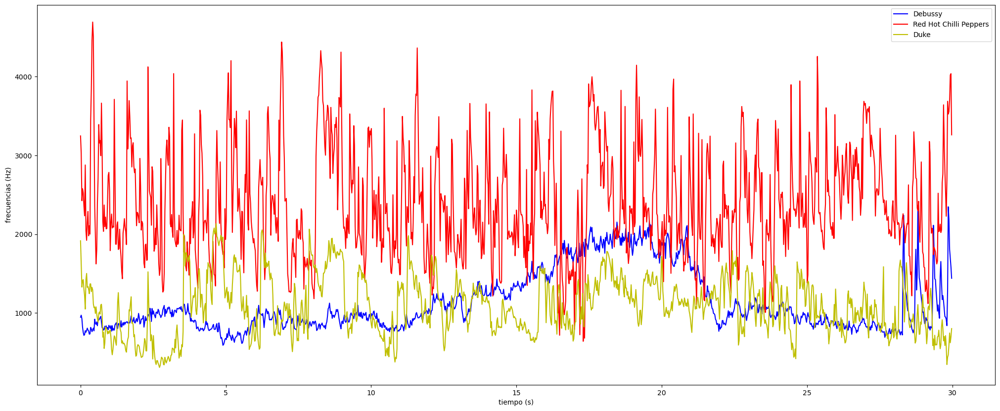

In [ ]:
frames = range(len(centroide_Spec_debussy))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)  # vector de tiempos

plt.figure(figsize=(25,10))

plt.plot(t, centroide_Spec_debussy, color='b', label = "Debussy")
plt.plot(t, centroide_Spec_redhot, color='r', label = "Red Hot Chilli Peppers")
plt.plot(t, centroide_Spec_duke, color='y', label = "Duke")
plt.ylabel("frecuencias (Hz)")
plt.xlabel("tiempo (s)")
plt.legend()
plt.show()



#### ------------- Ejercicio 7----------


Calcular los centroides de las señales bird1 y bird2 como hicimos recien y graficarlas

In [ ]:
centroide_bird1 = #librosa.feature.spectral_centroid(y=bird1, sr= sample_rate, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
centroide_bird2 = #librosa.feature.spectral_centroid(y=bird2, sr= sample_rate, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]



Notar que son de tamaños distintos y en este caso hay que definir grillas de tiempos distintos para cada plot

In [ ]:

print(centroide_bird1.shape)

print(centroide_bird2.shape)

(432,)
(433,)


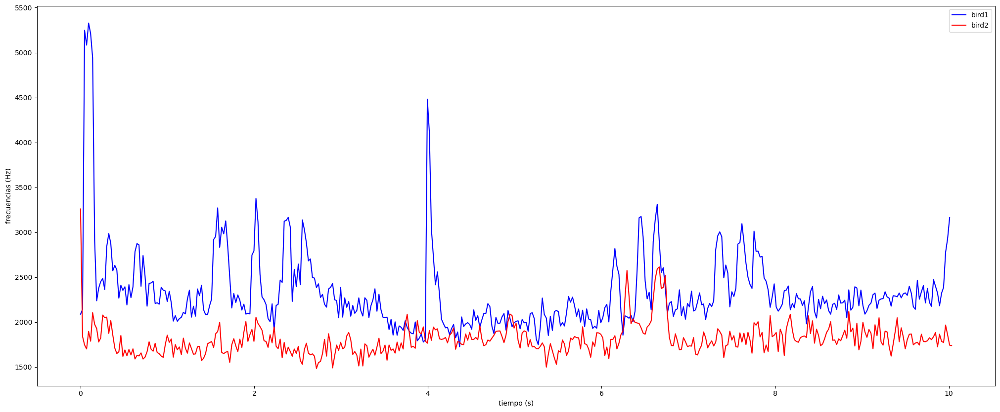

In [ ]:
frames1 = #range(len(centroide_bird1))
t1 = #librosa.frames_to_time(frames1, hop_length=HOP_LENGTH)  # vector de tiempos

frames2 = #range(len(centroide_bird2))
t2 = #librosa.frames_to_time(frames2, hop_length=HOP_LENGTH)  # vector de tiempos


plt.figure(figsize=(25,10))

# plt.plot(t1, centroide_bird1, color='b', label = "bird1")
# plt.plot(t2, centroide_bird2, color='r', label = "bird2")
# plt.ylabel("frecuencias (Hz)")
# plt.xlabel("tiempo (s)")
# plt.legend()
# plt.show()

### Ancho de banda

El ancho de banda es un promedio ponderado de las distancias de las frecuencias al centroide espectral. Esto se calcula en cada ventana de la señal, con lo cual el resultado es un vector de anchos de bannda.

con ```Librosa.feature.espectral_band_width``` podemos calcular dicho ancho de banda bw

Ahora para tener una intuición de esta característica, determinemosla para los archivos de audio ```debussy```, ```Red Hot``` y ```duke```. Como antes, recomiendo escucharlos y contrastar lo escuchado con la visualización.

In [ ]:
bw_debussy = librosa.feature.spectral_bandwidth(y=debussy, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
bw_redhot = librosa.feature.spectral_bandwidth(y=redhot, sr= sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
bw_duke = librosa.feature.spectral_bandwidth(y=duke, sr=sr, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [ ]:
print(bw_debussy.shape)

print(bw_redhot.shape)

print(bw_duke.shape)

(1292,)
(1292,)
(1292,)


#### Visualicemos el ancho de banda


Comos los tres arrays de ancho de banda tienen la misma cantidad de componentes, usamos una sola grilla de tiempos para graficar las tres.

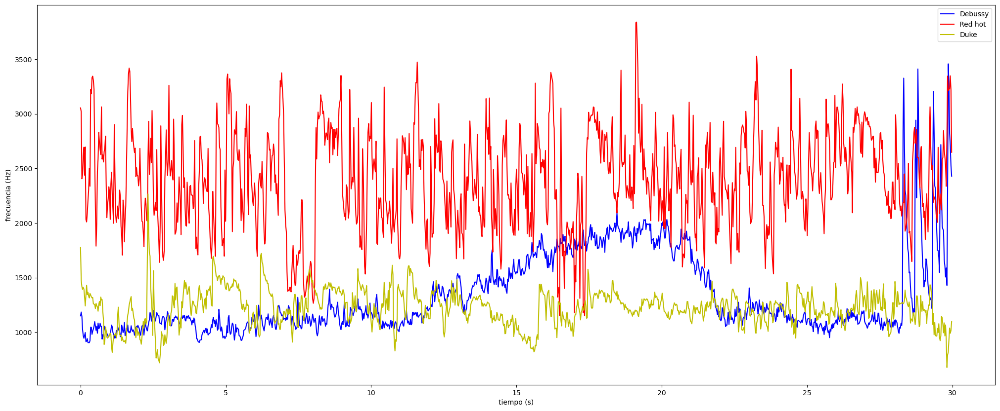

In [ ]:
frames = range(len(bw_debussy))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)  # vector de tiempos


plt.figure(figsize=(25,10))

plt.plot(t, bw_debussy, color='b', label = "Debussy")
plt.plot(t, bw_redhot, color='r', label = "Red hot")
plt.plot(t, bw_duke, color='y', label = "Duke")
plt.xlabel("tiempo (s)")
plt.ylabel("frecuencia (Hz)")
plt.legend()
plt.show()

#### ---------- Ejercicio ------------

Calcular y graficar el ancho de banda de bird1 y bird2

In [ ]:
bird1_bw = #librosa.feature.spectral_bandwidth(y=bird1, sr = bird1_sample_rate, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

bird2_bw = #librosa.feature.spectral_bandwidth(y=bird2, sr = bird1_sample_rate, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]


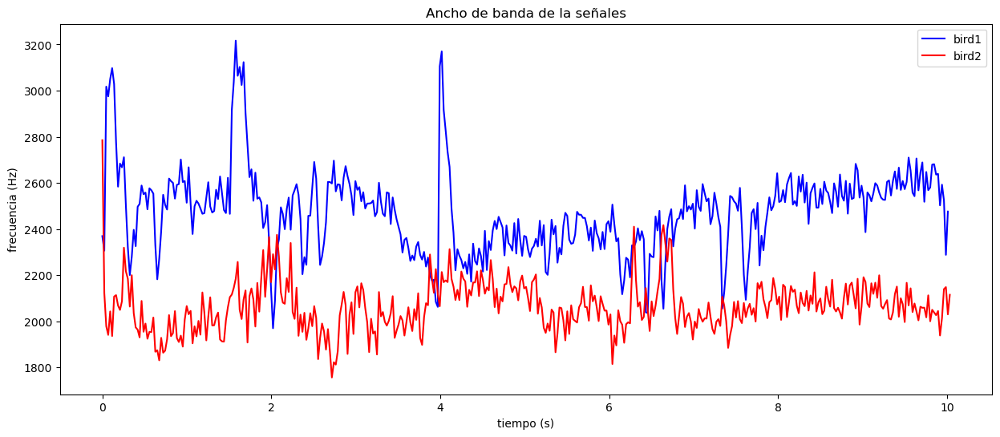

In [ ]:

# vector de los tiempos
frames1 = range(len(bird1_bw))
t1 = librosa.frames_to_time(frames1, hop_length=HOP_LENGTH)

frames2 = range(len(bird2_bw))
t2 = librosa.frames_to_time(frames2, hop_length=HOP_LENGTH)

# visualizamos
plt.figure(figsize=(15,6))
# plt.plot(t1, bird1_bw, color="b", label = "bird1")
# plt.plot(t2, bird2_bw, color="r", label = "bird2")
# plt.ylabel("frecuencia (Hz)")
# plt.xlabel("tiempo (s)")
# plt.title("Ancho de banda de la señales")
# plt.legend()
# plt.show()



---



---



---



## Metodología:

El archivo ```labels.csv``` contiene en cada fila el nombre de un audio (**itemid**) y si en dicho audio hay un presente el canto de un pájaro o no (**hasbird**).

La siguiente función lee el archivo labels.csv y lo convierte en un data frame de pandas.
Usamos como indice del dataframe la columna **itemid** y como unica columna **"hasbird"** cuyos valores los convertimos en tipo de dato **boole** : es True  o False segun si en el archivo de audio se identificó la presencia de un pajaro o no



### Extracción de características

El conjunto de las 100 señales de audio se encuentra en la carpeta ```AudioFiles```, son las grabaciones en formato ```.wav``` que vamos a procesar y a las cuales les vamos a extraer algunas de las características mencionadas en el marco teórico.


Como cada audio es un vector de 220672 componentes (esto lo vimos en la sección [Section Guardemos el audio en forma de vector](#scrollTo=8WCl5huVDNXB&line=4&uniqifier=1)), la idea es resumir cada señal de audio en sus características (*features*) y a partir de estas predecir si dada un señal de estas, hay presencia de un pájaro en el audio o no.


Las características que elegimos para resumir cada señal son:


*   <font color = magenta>mean_zcr</font>: El promedio de los zero cross rate. Esto es, a cada señal de audio le calculamos su **zcr** (zero cross rate: como lo
 [Section Zero Crossings rate](#scrollTo=jeeCpljRBge5&line=2&uniqifier=1)) que como resultado es un vector con los **zcr** por ventana, a estos valores los promediamos y obtenemos el **mean_zcr**.

*   <font color = magenta>mean_rms</font>: El promedio de las raices cuadradas de la energía media. Esto es, a cada señal de audio le calculamos su rms (como lo calculamos en la sección [Section RMS](#scrollTo=wrN_8plbdYyg&line=1&uniqifier=1) que como resultado es un vector con los **rms** por ventana, a estos valores los promediamos y obtenemos el **mean_rms**.


* <font color = magenta>max_centroide</font>: El valor maximo de los centroides espectrales. Esto es, a cada señal de audio le calculamos su centroide espectral (como lo calculamos en la sección [Section Centroide espectral](#scrollTo=8N8MM0XSvA30&line=2&uniqifier=1) que como resultado es un vector con los centroides espectrales por ventana, entre todos esos centroides nos quedamos con el mas grande.


* <font color = magenta>window_bw</font>: Para cada señal de audio calculamos su **ancho de banda** en cada ventana (como lo hicimos en la sección [Section Ancho de banda](#scrollTo=xBGd9z-tsFCa&line=2&uniqifier=1)) Una vez calculado este vector de anchos de bandas que va a tener un cierto tamaño (432) sampleamos num_window = 10 anchos de bandas. Esto es porque resumir el ancho de banda de una señal de audio a un solo número puede significar poca información.


En total vamos a tener 13 variables regresoras:


$x_1= $  *mean_zcr*

$x_2= $  *mean_rms*

$x_3= $  *max_sc* (max_centroide)

$x_4,\dots,x_{13} =$ las 10 componentes de *window_bw*

In [ ]:
def read_labels():

    """
    Esta funcion lee el archivo labels.csv y lo convierte en un data frame de pandas.
    Usamos como indice del dataframe el nombre del archivo de audio y como unica columna "hasbird"
    que es True o False segun si en el archivo de audio se identificó el canto de un pajaro o no
    """

    ruta = "labels.csv"
    df = pd.read_csv(ruta, index_col="itemid", dtype={"hasbird":bool})

    return df.hasbird

In [ ]:
data_labels = read_labels()


# veamos las primeras 5 filas de data_labels
data_labels.head()

itemid
759808e5-f824-401e-9058     True
1d94fc4a-1c63-4da0-9cac     True
bb0099ce-3073-4613-8557     True
c4c67e81-9aa8-4af4-8eb7     True
ab322d4b-da69-4b06-a065    False
Name: hasbird, dtype: bool

In [ ]:
type(data_labels)

pandas.core.series.Series

In [ ]:
len(data_labels)

100

Notar que data_labels es un objeto ```Series``` de pandas, es como un data frame pero con una unica columna y un indice.

In [ ]:
# acceder al nombre de la unica columna
print(data_labels.name)

hasbird


HAy varias formas de acceder a una fila de un pandas series: una es indicandole el numero de la fila, y otra indicandole el indice de dicha fila

In [ ]:
data_labels.iloc[0]  # me dice que valor tiene hasbird para la fila 0

True

In [ ]:
data_labels.loc["759808e5-f824-401e-9058"]  # me dice que valor tiene hasbird para la fila 0 que es la que tiene itemid "759808e5-f824-401e-9058"

True

#### -------------- Ejercicio 8 ---------------------

Implementar una rutina que reciba como inputs una señal de audio dada y un valor de sample_rate  especificado y devuelva en forma de vector las características mencionadas arriba. Esta función va a darnos el "resumen" de una señal de audio.

In [ ]:
# convertimos una senial de  audio  en un vector de features
def featurize(signal,sample_rate):

    FRAME_SIZE = 1024
    HOP_LENGTH = 512

    # zero crossing rate
    zcr = librosa.feature.zero_crossing_rate(y=signal, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]# completar
    mean_zcr = np.mean(zcr)
    #max_zcr = np.max(zcr)

    # root mean square
    rms =  librosa.feature.rms(y=signal, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]# completar
    mean_rms = np.mean(rms)
    #max_rms = np.max(rms)


    # centroide espectral
    sc = librosa.feature.spectral_centroid(y=signal, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]# completar
    #mean_sc = np.mean(sc)
    max_sc = np.max(sc)

    # bandwidth
    bw = librosa.feature.spectral_bandwidth(y=signal, sr= sample_rate, n_fft=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
    #mean_bw = np.mean(bw)
    num_windows = 10
    window_i = np.linspace(0,len(bw)-1,num_windows,dtype=int)
    window_bw = bw[window_i]


    return np.hstack((mean_zcr,mean_rms, max_sc, window_bw))

Ahora, usando la rutina ```featurize``` armamos nuestros conjuntos de datos $X$ e $y$.

$y$ es la variable respuesta que queremos predecir como True o False

$X$ es la matriz de los datos, cada fila es una observacion de las características calculadas con la rutina```featurize```

In [ ]:
X = []    # empiezo con lista vacia
Y = []    # empiezo con lista vacia

# Elegimos los primeros 20 audios de la lista de labels

for audio_id in data_labels.index:

    audio_file = f"./AudioFiles/{audio_id}.wav"   # en lugar "./data/audio_files/ la ruta de acceso del archivo

    audio, audio_sr = librosa.load(audio_file) # audio importado y su rate de sampleo
    X.append(featurize(audio,audio_sr))
    Y.append(data_labels[audio_id])
X = np.array(X)
Y = np.array(Y)
print(X.shape, Y.shape)

(100, 13) (100,)


## Clasificación
La libreria que usamos para hacer la clasificación es ```sklearn.linear_model```.

La forma de clasificar es haciendo una **regresión logística** para predecir la **probabilidad** de que en una señal de audio dado haya un canto de un pájaro, es decir, usando las variables regresoras $x_1,x_2,\dots,x_{13}$ predecir la probabilidad de que la respuesta **hasbird** sea 1 o **True** (osea en el audio hay un canto de un pájaro) dado que sabemos los valores de las características de dicho audio, esto es:

$$
\mathbb{P}(\text{hasbird} = 1 \text{ conocidos los valores de las regresoras}) = \frac{1}{1 + \exp(-(\beta_0 +\beta_1x_1 + \dots +\beta_{13}x_{13}))}
$$

donde los coeficientes $\beta_0, \beta_1, \dots, \beta_{13}$ los estimamos usando el conjunto de datos.

**Comentario 1**: La regresión logística es similar una regresión lineal, solo que en este caso no tenemos ecuaciones normales para calcular de forma "exacta" los coeficientes y por eso usamos las librerías de python que lo hacen por nosotros en forma numérica.


**Comentario 2**: Si bien la variable respuesta que queremos predecir es 1 o 0 (o True False), en este tipo de problemas lo que se hace es predecir la probabilidad de ser 1 (o True). Por convención si esta probabilidad da mayor que 0.5 entonces se clasifica la respuesta como 1 (True).

importamos las librerías para hacer la partición y la regresión

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

Primero partimos el conjunto de datos en X_train, y_train, X_test, y_test, es decir nos quedamos con un subconjunto de observaciones de X e y para "entrenar" el modelo (aprender los coeficientes de la regresión ) y la otra parte la usamos para testear el modelo.

Con test_size =0.2 estamos eligiendo 20% de los datos, es decir 20 datos para testear y 80 para entrenar, es decir usamos 80 datos para ajustar los coeficientes $\beta_0.\beta_1,\dots\beta_{13}$ de la regresión logíistica y los 20 restantes para contrastar las predicciones


In [ ]:
# Spliteamos el conjunto de datos en X_train, y_train, X_test, y_test
#con test_size =0.2 estamos eligiendo 20% de los datos para testear y 80 para entrenar

X_train, X_test, y_train, y_test = train_test_split(X,  0.+0.21220659Y, test_size= 0.2, random_state = 0)

In [ ]:
print(X_train.shape)

print(y_train.shape)


(80, 13)
(80,)


In [ ]:
print(X_test.shape)

print(y_test.shape)

(20, 13)
(20,)


La clase ```LogisticRegression``` funciona muy similar a otras clases (objeto de python) que creamos usando sklear. Por ejemplo para realizar un clustering con Kmeans inicializamos una clase KMeans(). Acá se hace de forma similar, se inicializa una clase (objeto de python) ```LogisticRegression()``` y le aplicamos el método fit usando los datos de esntrenamiento

In [ ]:
# usamos LogisticRegression para hallar el modelo ajustado:


modelo_ajustado = LogisticRegression(random_state=0).fit(X_train, y_train)

Una vez que aplicamos la regresión logiística, con el "atributo" ```.coef_``` obtenemos el valor de cada uno de los $\beta_j$, estos valores los guardamos en la variable **coeficientes**

In [ ]:
coeficientes = modelo_ajustado.coef_   # modelo.coef_ nos da los coeficientes de la regresion
beta0 = modelo_ajustado.intercept_

coeficientes = coeficientes.ravel()


In [ ]:
print("los coeficientes de las x's son : ", coeficientes, "\n\n el beta_0 = ", beta0)

los coeficientes de las x's son :  [ 3.36360309e-06  4.45168844e-06 -2.28002125e-04  4.03589334e-05
  1.18053779e-03  1.86122934e-04 -1.07850821e-03  1.40509536e-04
 -1.54641882e-04 -2.65830767e-03  3.03343311e-04  2.75760453e-03
  4.10633558e-04] 

 el beta_0 =  [1.89845447e-06]


Una vez sabemos los coeficientes podemos calcular "a mano" la probabilidad predicha para un conjunto de valores especificados de las variables regresoras $x_1, x_2, \dots, x_{13}$

In [ ]:
print(X_train[0, :])
print(y_train[0])


[1.83207102e-01 3.65627594e-02 5.34990002e+03 3.12096212e+03
 2.41889111e+03 1.23319534e+03 2.38194542e+03 2.39323495e+03
 2.39938849e+03 1.86864371e+03 2.40975887e+03 2.43519242e+03
 2.38067050e+03]
True


In [ ]:
x = X_train[0, :]

proba_predicha_x = 1/(1+ np.exp(-np.dot(x,coeficientes) - beta0))

print("La proba predicha para valores de la regresoras dados por : \n", x, " \n\n es: ", proba_predicha_x)

La proba predicha para valores de la regresoras dados por : 
 [1.83207102e-01 3.65627594e-02 5.34990002e+03 3.12096212e+03
 2.41889111e+03 1.23319534e+03 2.38194542e+03 2.39323495e+03
 2.39938849e+03 1.86864371e+03 2.40975887e+03 2.43519242e+03
 2.38067050e+03]  

 es:  [0.94500796]


### Predicción

La predicción en regresión logística es de dos tipos:

1. Podemos predecir la probabilidad de exito, que en nuestro caso es ```hasbird =1```, esta probabilidad se puede calcular a mano, una vez conocidos los coeficientes, como lo hicimos en la celde de arriba. También en su lugar podemos usar el método ```predict_proba``` para calcular dicha probabilidad directamente.

2. Podemos predecir (clasificar) ```hasbird``` como 0 o 1 (0: no hay canto de un pájaro, 1: hay canto de un pájaro). Esto se puede hacer usando el método ```predict``` aplicado a ```modelo_ajustado```.

Python por defecto clasifica como éxito (como 1) si la probabilidad estimada es mayor a 0.5 y como fracaso (como 0) si la probabilidad es menor que 0.5



Podemos usar el método ```predict``` sobre ```modelo_ajustado``` para predecir (por 0 o 1) para valores de las variables regresoras (valores de las X's).


El input de predict que indica los valores de las variables regresoras para las cuales queremos predecir **hasbird**  debe ser un vector fila(un array de numpy de dimensión 2, en nuestro caso el shape debe ser (1, 13) )

In [ ]:
# con reshape(1,-1) aseguramos que sea vector fila

print("La prediccion de hasbird para un audio con regresoras \n X = ", X_train[0, :], " \n\n es :", modelo_ajustado.predict(X_train[0,:].reshape(1, -1))   )

La prediccion de hasbird para un audio con regresoras 
 X =  [1.83207102e-01 3.65627594e-02 5.34990002e+03 3.12096212e+03
 2.41889111e+03 1.23319534e+03 2.38194542e+03 2.39323495e+03
 2.39938849e+03 1.86864371e+03 2.40975887e+03 2.43519242e+03
 2.38067050e+03]  

 es : [ True]


Hagamos una predicción para un conjunto de valores de la resgresoras en el conjunto X_test

In [ ]:
indices = [2, 4, 7]

test_data = X_test[indices, :].reshape(len(indices), -1)

print("para los datos", test_data, " la predicción de hasbird es :")

print("\n \n ", modelo_ajustado.predict(test_data))

para los datos [[1.59818728e-01 1.05096929e-01 5.43212309e+03 3.13064327e+03
  1.77826092e+03 1.94741387e+03 1.79747094e+03 1.71462064e+03
  1.70957071e+03 1.79590926e+03 1.73338741e+03 1.86605748e+03
  2.57239071e+03]
 [2.87212882e-01 2.10502651e-02 6.42631052e+03 3.00389696e+03
  3.07653738e+03 2.43745998e+03 2.25659401e+03 3.10999055e+03
  1.25556297e+03 3.38352907e+03 3.10673303e+03 2.58945853e+03
  1.77071018e+03]
 [1.16515408e-01 2.19806097e-02 5.37195458e+03 2.85230844e+03
  3.01271412e+03 2.97074193e+03 2.79923789e+03 2.87655359e+03
  2.84330610e+03 2.87372887e+03 2.44198263e+03 1.70965793e+03
  2.17245312e+03]]  la predicción de hasbird es :

 
  [ True  True False]


Veamos cuales son los valores de hasbird para estos indices:

In [ ]:
y_test[indices]

array([ True,  True,  True])

Notar que en el indice 7 el modelo cometió un error en la predicción, lo predijo como False (o 0: no hay un canto de un pajaro) cuando en verdad es True (o 1: Hay un canto de un pájaro)

#### -------------Ejercicio 8 ------------

Predecir para otras observaciones dentro del conjunto de train y de test.

Calcular la cantidad de veces que predijo mal (incorrectamente) en el conjunto de test y en el conjunto de Train y a partir de estos números dar el porcentaje de error, es decir el porcentaje de veces que predijo mal tanto en el conjunto test como en el conjunto train. Estos dos porcentantes se llaman porcentaje de error **in sample** (en la muestra) y **out sample** (afuera de la muestra).

### Conclusiones finales

Hasta ahora solo hicimos una parte de lo que sería clasificación/predicción. Todavía se puede evaluar el ejuste hecho calculando distintas métricas por ejemplo: calcular la matrix de confusion de la regresion entre otras.

En esta última parte cada grupo, si así lo desea puede completar con lo que sería la evaluación del modelo.

